# Understanding the Impact of a Community's Socioeconomic and Health Resource Status on COVID-19 Fatality#

Our project aims to answer the question of whether or not your community's characteristics impact the number of COVID-19 deaths. Specifically, we take a look at different socioeconomic and health-related features of your locality and through our exploratory data analysis, feature selection, and model building process, are able to determine which aspects of your county impact its COVID-19 fatalities (given confirmed cases).

Datasets Used:

**Time Series COVID-19 Deaths Data (Counties/States):** 
https://github.com/CSSEGISandData/COVID19/blob/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_US.csv

**Time Series Confirmed COVID-19 Cases Data (Counties/States):**
https://github.com/CSSEGISandData/COVID19/blob/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv 

**Statistics on Counties:**
https://github.com/Yu-Group/covid19-severity-prediction/blob/master/data/county_data_abridged.csv

**Socioeconomic Statistic on Counties:**
https://www.kaggle.com/muonneutrino/us-census-demographic-data?select=acs2015_census_tract_data.csv

In [1]:
#!pip install plotly==4.7.1

# imports
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.graph_objects as go


%matplotlib inline

import seaborn as sns
sns.set(style = "whitegrid", 
        color_codes = True,
        font_scale = 1.5)

You should consider upgrading via the 'c:\anaconda3\python.exe -m pip install --upgrade pip' command.


In [2]:
# load the data
deaths = pd.read_csv('covid19/time_series_covid19_deaths_US.csv')
confirmed = pd.read_csv('covid19/time_series_covid19_confirmed_US.csv')
counties = pd.read_csv('covid19/abridged_couties.csv')
economics = pd.read_csv('covid19/acs2015_county_data.csv')

## Part 1: Data Visualizations ##

We'd like to start just by visualizing the growth of the virus in very populous counties and less populous counties. This will help us understand the role that population plays in the growth of the virus.  

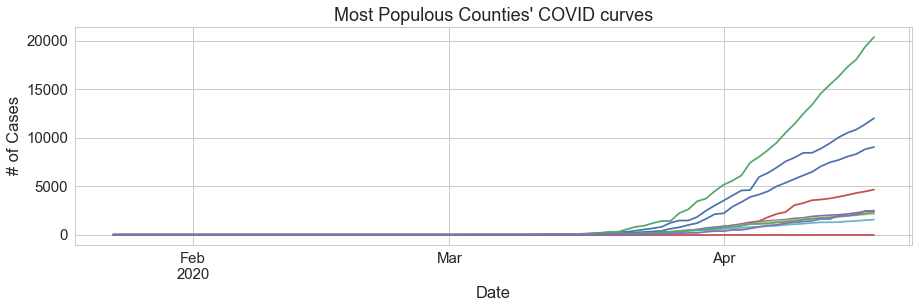

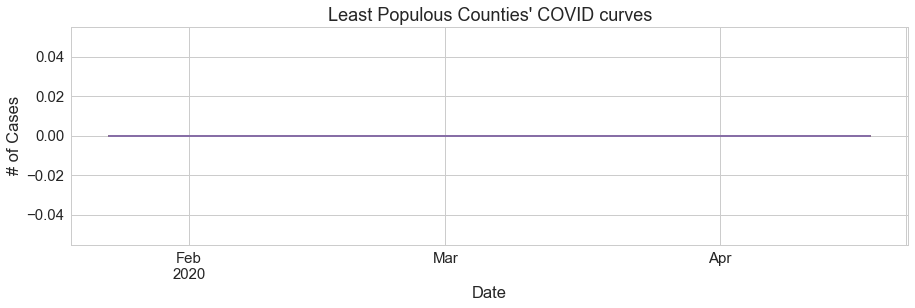

In [3]:
counties = counties[~counties['State'].isnull()]

# merge counties information with time_series confirmed
counties["countyFIPS"] = counties["countyFIPS"].astype('int')
confirmed["FIPS"] = confirmed["FIPS"].fillna(0).astype('int')

counties_conf = pd.merge(left=confirmed, right=counties, how='inner', left_on="FIPS", right_on="countyFIPS")

# 10 of the most populous counties: 
most_pop_conf = counties_conf.sort_values(by="PopulationEstimate2018", ascending=False).iloc[:10]
# 10 of the least populous counties
least_pop_conf = counties_conf.sort_values(by="PopulationEstimate2018", ascending=True).iloc[:10]

most_pop_conf = most_pop_conf.set_index("FIPS")
time_series = most_pop_conf.iloc[:, 11:98]

to_plot = time_series.T
to_plot = to_plot.set_index(pd.to_datetime(to_plot.index))
to_plot.plot(legend=False, figsize=(15,4))
plt.title("Most Populous Counties' COVID curves")
plt.xlabel("Date")
plt.ylabel("# of Cases")
plt.show()

least_pop_conf = least_pop_conf.set_index("FIPS")
time_series = least_pop_conf.iloc[:, 11:98]
to_plot = time_series.T
to_plot = to_plot.set_index(pd.to_datetime(to_plot.index))
to_plot.plot(legend=False, figsize=(15,4))
plt.title("Least Populous Counties' COVID curves")
plt.xlabel("Date")
plt.ylabel("# of Cases")
plt.show()

As expected, the larger counties seem to be showing exponential (rather logistic growth). On the other hand, the less populous counties' have data constant at 0 showing that these counties have not yet been hit with the virus. Maybe population is what puts these counties apart, but is there anything else?

Our question aims to **analyze the effect of socioeconomic, availability of health resources, overall health status of the county, and preventative measures put in place by the government on confirmed cases of COVID-19**



Here are some heatmaps showing the correlation between the first three factors we discussed above and confirmed and death cases.

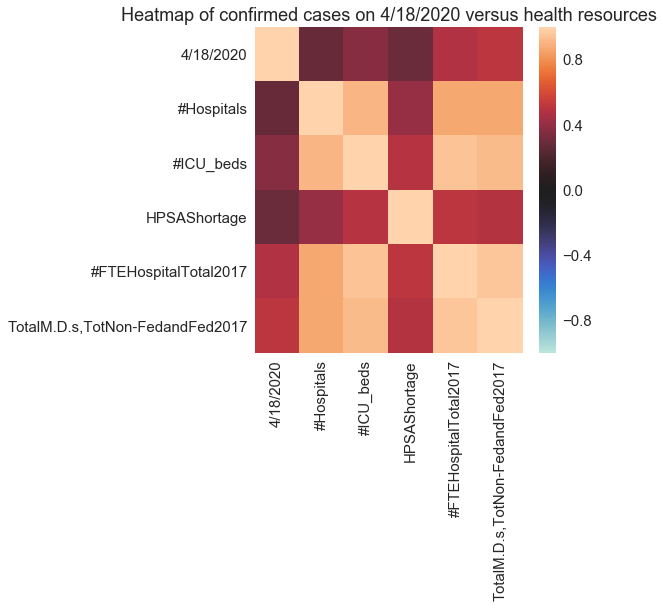

In [4]:
# Let's look at a heatmap of the hospital resources (HPSA Shortage, #Hospitals, #ICUBeds)
health_resources = counties_conf.iloc[:, 98:]
# health_resources = health_resources["HPSAShortage", "#Hospitals", "#ICU_beds"]
health_resources.columns
health_resources = health_resources[["4/18/2020", "#Hospitals", "#ICU_beds", "HPSAShortage", 
                                     "#FTEHospitalTotal2017", "TotalM.D.s,TotNon-FedandFed2017"]]
plt.figure(figsize=(6,6))
full_corr = health_resources.corr()
ax = sns.heatmap(
    full_corr, 
    vmin=-1, vmax=1, center=0
)
plt.title("Heatmap of confirmed cases on 4/18/2020 versus health resources")
plt.show()


The above heatmap shows a correlation with nummber of employees and doctors available in the county. The other features have very slight correlation

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



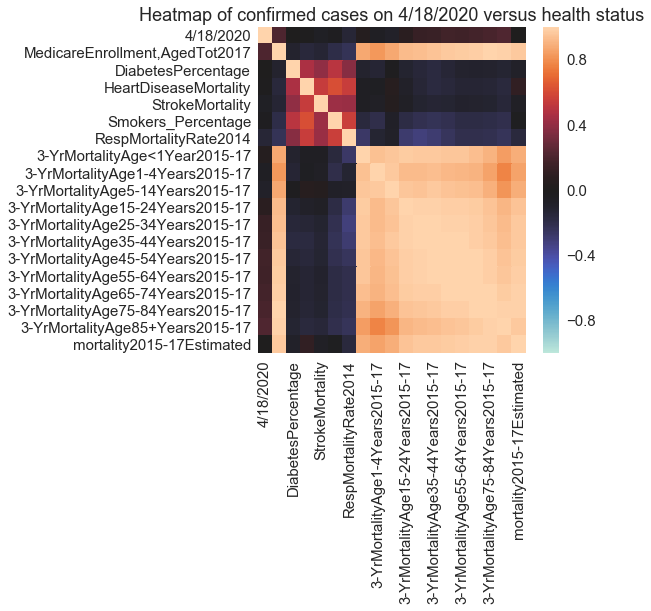

In [5]:
counties_cols = ["4/18/2020", 'MedicareEnrollment,AgedTot2017', 'DiabetesPercentage', 'HeartDiseaseMortality', 'StrokeMortality',
       'Smokers_Percentage', 'RespMortalityRate2014', '3-YrMortalityAge<1Year2015-17',
       '3-YrMortalityAge1-4Years2015-17', '3-YrMortalityAge5-14Years2015-17',
       '3-YrMortalityAge15-24Years2015-17',
       '3-YrMortalityAge25-34Years2015-17',
       '3-YrMortalityAge35-44Years2015-17',
       '3-YrMortalityAge45-54Years2015-17',
       '3-YrMortalityAge55-64Years2015-17',
       '3-YrMortalityAge65-74Years2015-17',
       '3-YrMortalityAge75-84Years2015-17', '3-YrMortalityAge85+Years2015-17',
       'mortality2015-17Estimated']

heat_health_status = counties_conf[counties_cols]
heat_health_status["4/18/2020"] = counties_conf["4/18/2020"]/counties_conf["PopulationEstimate2018"]

plt.figure(figsize=(6,6))
full_corr = heat_health_status.corr()
ax = sns.heatmap(
    full_corr, 
    vmin=-1, vmax=1, center=0
)
plt.title("Heatmap of confirmed cases on 4/18/2020 versus health status")
plt.show()

Here, the features are not remarkably correlated— maybe there is slight correlation with Medicare enrollment and the mortality rates.

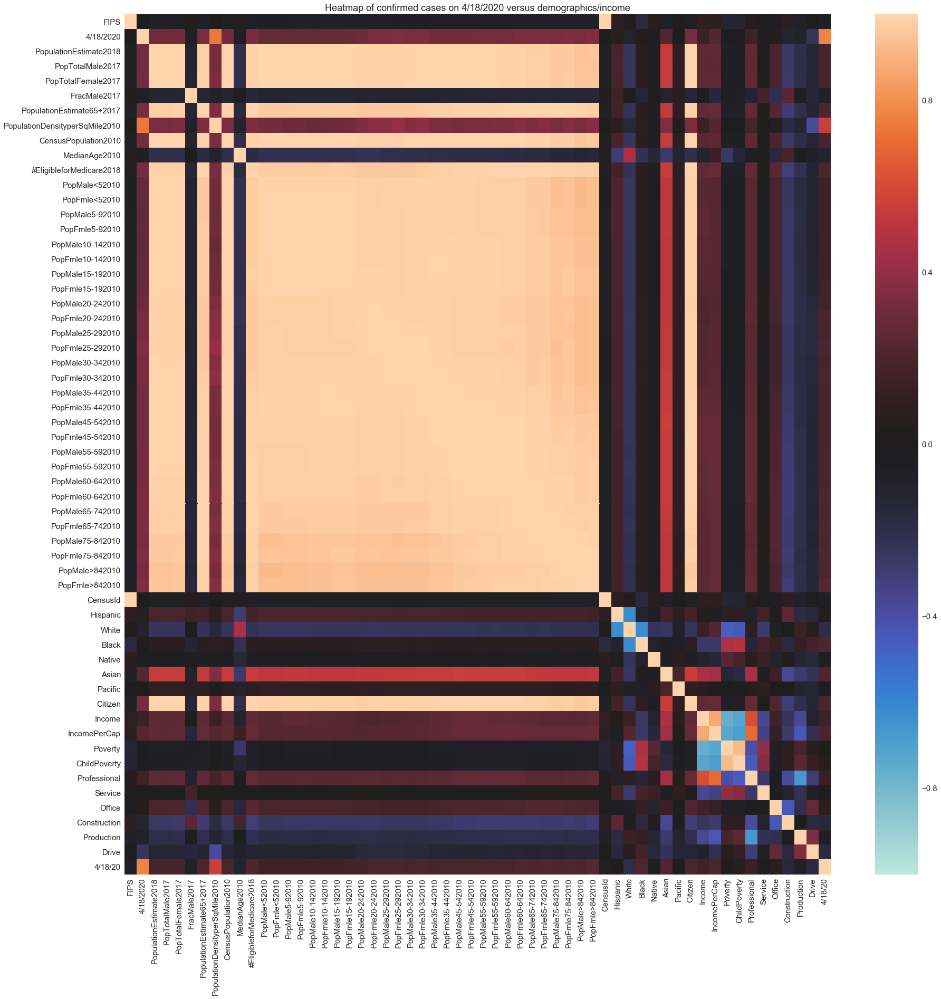

In [6]:
# Now let's look at a heatmap of population demographics versus the last day

counties_conf["FIPS"] = counties_conf["FIPS"].astype(int)
economics["CensusId"] = economics["CensusId"].astype(int)

columns_counties_conf=["FIPS", "4/18/2020", 'PopulationEstimate2018', 'PopTotalMale2017', 'PopTotalFemale2017',
       'FracMale2017', 'PopulationEstimate65+2017',
       'PopulationDensityperSqMile2010', 'CensusPopulation2010',
       'MedianAge2010', '#EligibleforMedicare2018','PopMale<52010',
       'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopMale10-142010',
       'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010',
       'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010',
       'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010',
       'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010',
       'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010',
       'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010',
       'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010',
       'PopMale>842010', 'PopFmle>842010']
counties_conf_to_merge = counties_conf[columns_counties_conf]
economics_cols = ["CensusId", 'Hispanic', 'White',
       'Black', 'Native', 'Asian', 'Pacific', 'Citizen', 'Income',
       'IncomePerCap', 'Poverty', 'ChildPoverty',
       'Professional', 'Service', 'Office', 'Construction', 'Production',
       'Drive']


heat_demo = pd.merge(left = counties_conf[columns_counties_conf], right = economics[economics_cols], 
                     how="inner", left_on="FIPS", right_on="CensusId")
heat_demo["4/18/20"] = counties_conf["4/18/2020"]/counties_conf["PopulationEstimate2018"]

plt.figure(figsize=(30,30))
full_corr = heat_demo.corr()
ax = sns.heatmap(
    full_corr, 
    vmin=-1, vmax=1, center=0
)
plt.title("Heatmap of confirmed cases on 4/18/2020 versus demographics/income")
plt.show()

Unlike what we expected, much of the correlations on the "4/18/2020" row/column are very low. They're a little better in the column labeled "4/18/20" which represents confrimed percentage, but still quite low. Why is this the case?
Another thing we can look at is the death rate of confirmed cases— maybe because tests are so few and not evenly distributed, the number of people infected is innacurate. However, given that number, the percentage of people that die from the virus can give a more accurate representation of the effect of these factors.

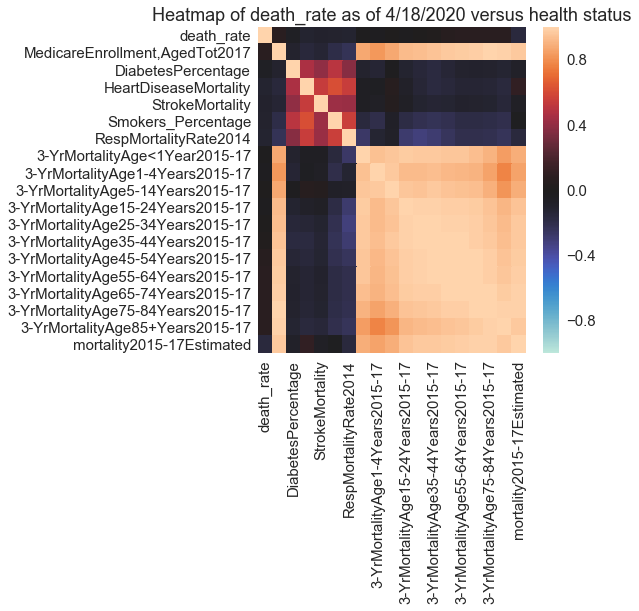

In [7]:
final_deaths = deaths[["FIPS", "4/18/2020"]]
deaths_conf = pd.merge(counties_conf, final_deaths, how='inner', left_on="FIPS", right_on="FIPS")
deaths_conf
deaths_conf["death_rate"] = deaths_conf["4/18/2020_x"]/deaths_conf["4/18/2020_y"]

counties_cols = ["death_rate", 'MedicareEnrollment,AgedTot2017', 'DiabetesPercentage', 'HeartDiseaseMortality', 'StrokeMortality',
       'Smokers_Percentage', 'RespMortalityRate2014', '3-YrMortalityAge<1Year2015-17',
       '3-YrMortalityAge1-4Years2015-17', '3-YrMortalityAge5-14Years2015-17',
       '3-YrMortalityAge15-24Years2015-17',
       '3-YrMortalityAge25-34Years2015-17',
       '3-YrMortalityAge35-44Years2015-17',
       '3-YrMortalityAge45-54Years2015-17',
       '3-YrMortalityAge55-64Years2015-17',
       '3-YrMortalityAge65-74Years2015-17',
       '3-YrMortalityAge75-84Years2015-17', '3-YrMortalityAge85+Years2015-17',
       'mortality2015-17Estimated']

heat_health_status = deaths_conf[counties_cols]

plt.figure(figsize=(6,6))
full_corr = heat_health_status.corr()
ax = sns.heatmap(
    full_corr, 
    vmin=-1, vmax=1, center=0
)
plt.title("Heatmap of death_rate as of 4/18/2020 versus health status")
plt.show()

Re-doing the second heatmap as well, we get:

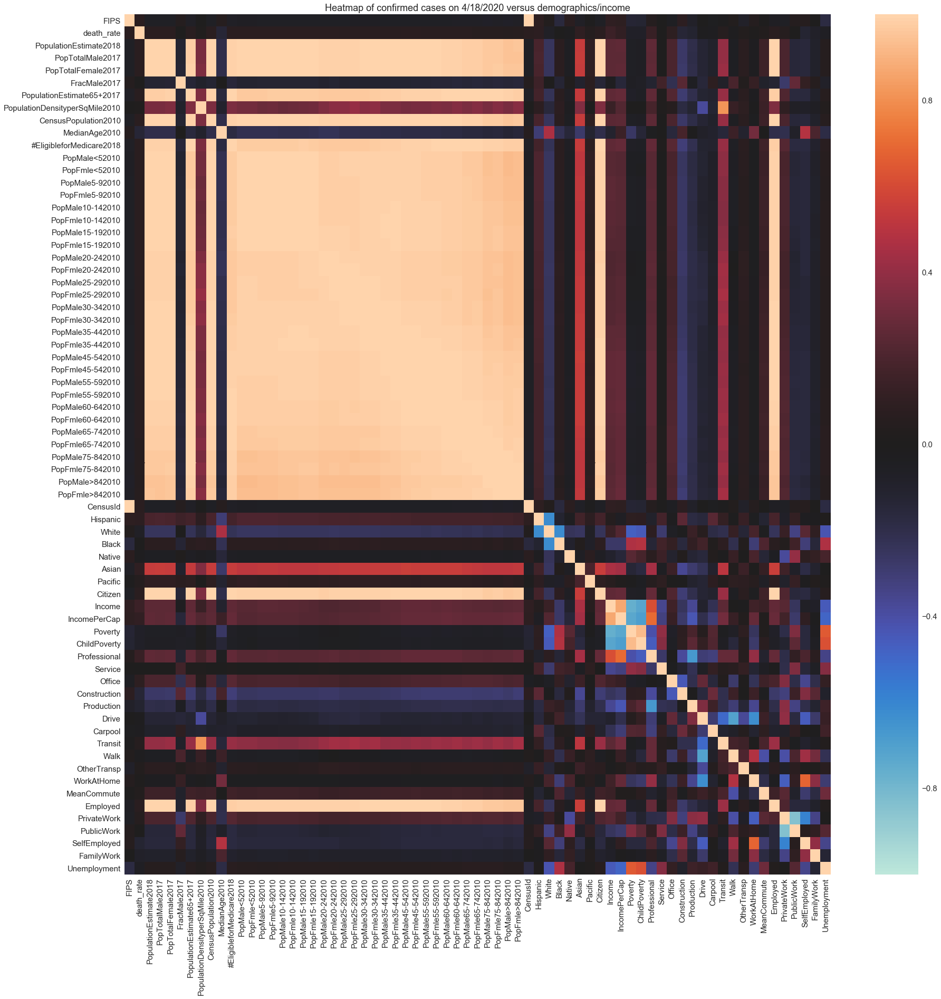

In [8]:
columns_counties_conf=["FIPS", "death_rate", 'PopulationEstimate2018', 'PopTotalMale2017', 'PopTotalFemale2017',
       'FracMale2017', 'PopulationEstimate65+2017',
       'PopulationDensityperSqMile2010', 'CensusPopulation2010',
       'MedianAge2010', '#EligibleforMedicare2018','PopMale<52010',
       'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopMale10-142010',
       'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010',
       'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010',
       'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010',
       'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010',
       'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010',
       'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010',
       'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010',
       'PopMale>842010', 'PopFmle>842010']
economics_cols = ["CensusId", 'Hispanic', 'White',
       'Black', 'Native', 'Asian', 'Pacific', 'Citizen', 'Income',
       'IncomePerCap', 'Poverty', 'ChildPoverty',
       'Professional', 'Service', 'Office', 'Construction', 'Production',
       'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute', 'Employed', 'PrivateWork',
                 'PublicWork', 'SelfEmployed', 'FamilyWork', 'Unemployment']


heat_demo = pd.merge(left = deaths_conf[columns_counties_conf], right = economics[economics_cols], 
                     how="inner", left_on="FIPS", right_on="CensusId")

plt.figure(figsize=(30,30))
full_corr = heat_demo.corr()
ax = sns.heatmap(
    full_corr, 
    vmin=-1, vmax=1, center=0
)
plt.title("Heatmap of confirmed cases on 4/18/2020 versus demographics/income")
plt.show()

The correlations for death rate is still pretty low, but it looks like features that could be significant come from demographic and socioeconomic data.

A major preventative action put into place by the government is Shelter in Place. Let's see how it affected the growth rate of confirmed cases in some example counties.

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



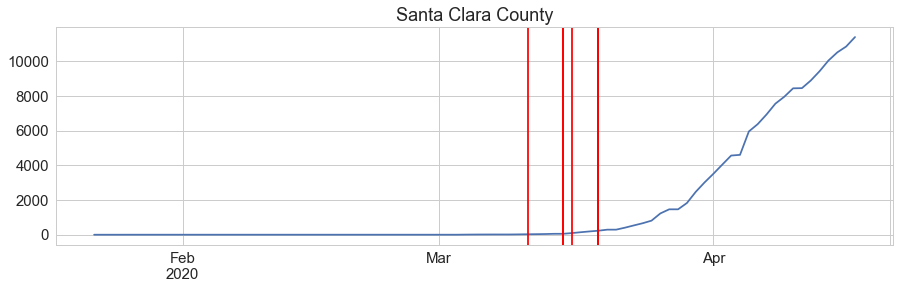

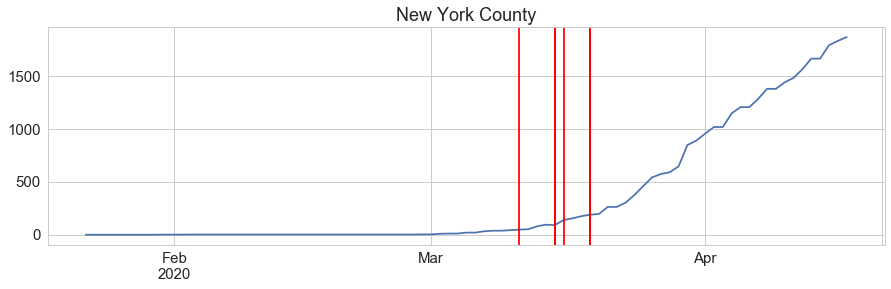

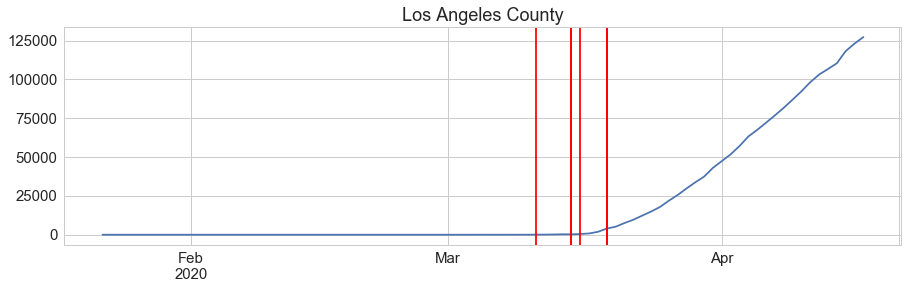

In [9]:
from datetime import datetime

three = counties_conf[(counties_conf["Admin2"] == "Santa Clara") | (counties_conf["Admin2"] == "Santa Clara") |(counties_conf["Admin2"] == "New York") 
              | (counties_conf["Admin2"] == "Los Angeles")]

columns = ["stay at home", ">50 gatherings", ">500 gatherings", "public schools", "restaurant dine-in", 
           "entertainment/gym", "federal guidelines", "foreign travel ban"]
for col in columns:
    three[col] = three[col].apply(lambda x: pd.Timestamp.fromordinal(int(x)))


time_series = three.iloc[0, 11:98]
to_plot = time_series.T
to_plot = to_plot.reindex(pd.to_datetime(to_plot.index))
to_plot.plot(legend=False, figsize=(15,4))
for col in columns:
    plt.axvline(x=three.loc[199, col], color="red")
plt.title("Santa Clara County")
plt.plot()
plt.show()

time_series = three.iloc[1, 11:98]
to_plot = time_series.T
to_plot = to_plot.reindex(pd.to_datetime(to_plot.index))
to_plot.plot(legend=False, figsize=(15,4))
for col in columns:
    plt.axvline(x=three.loc[199, col], color="red")
plt.title("New York County")
plt.plot()
plt.show()

time_series = three.iloc[2, 11:98]
to_plot = time_series.T
to_plot = to_plot.reindex(pd.to_datetime(to_plot.index))
to_plot.plot(legend=False, figsize=(15,4))
for col in columns:
    plt.axvline(x=three.loc[199, col], color="red")
plt.title("Los Angeles County")
plt.plot()
plt.show()

The shelter in place was started at about the same time, and yet still, these counties are facing logistic growth. In the next plot, we'll look at the confirmed rate with respect to how much of the population already worked from home. Maybe these restrictions were put in too late.

In [10]:
economics

,CensusId,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001,Alabama,Autauga,55221,26745,28476,2.6,75.8,18.5,0.4,...,0.5,1.3,1.8,26.5,23986,73.6,20.9,5.5,0.0,7.6
1,1003,Alabama,Baldwin,195121,95314,99807,4.5,83.1,9.5,0.6,...,1.0,1.4,3.9,26.4,85953,81.5,12.3,5.8,0.4,7.5
2,1005,Alabama,Barbour,26932,14497,12435,4.6,46.2,46.7,0.2,...,1.8,1.5,1.6,24.1,8597,71.8,20.8,7.3,0.1,17.6
3,1007,Alabama,Bibb,22604,12073,10531,2.2,74.5,21.4,0.4,...,0.6,1.5,0.7,28.8,8294,76.8,16.1,6.7,0.4,8.3
4,1009,Alabama,Blount,57710,28512,29198,8.6,87.9,1.5,0.3,...,0.9,0.4,2.3,34.9,22189,82.0,13.5,4.2,0.4,7.7
5,1011,Alabama,Bullock,10678,5660,5018,4.4,22.2,70.7,1.2,...,5.0,1.7,2.8,27.5,3865,79.5,15.1,5.4,0.0,18.0
6,1013,Alabama,Butler,20354,9502,10852,1.2,53.3,43.8,0.1,...,0.8,0.6,1.7,24.6,7813,77.4,16.2,6.2,0.2,10.9
7,1015,Alabama,Calhoun,116648,56274,60374,3.5,73.0,20.3,0.2,...,1.2,1.2,2.7,24.1,47401,74.1,20.8,5.0,0.1,12.3
8,1017,Alabama,Chambers,34079,16258,17821,0.4,57.3,40.3,0.2,...,0.3,0.4,2.1,25.1,13689,85.1,12.1,2.8,0.0,8.9
9,1019,Alabama,Cherokee,26008,12975,13033,1.5,91.7,4.8,0.6,...,0.6,0.7,2.5,27.4,10155,73.1,18.5,7.9,0.5,7.9


In [11]:
confpop = counties_conf[["FIPS", "Lat", "Long_", "Admin2", "Province_State", "PopulationEstimate2018", "4/18/2020"]].copy()
confpop["FIPS"] = confpop["FIPS"].astype(int)
confpop['FIPS'] = confpop['FIPS'].apply(func=lambda x:"0"+str(x) if len(str(x)) == 4 else str(x))
economics['CensusId'] = economics['CensusId'].apply(func=lambda x:"0"+str(x) if len(str(x)) == 4 else str(x))
economics["WorkAtHome_Normalized"] = (economics["WorkAtHome"] - economics["WorkAtHome"].mean())/economics["WorkAtHome"].std()
economics["WorkAtHome_Normalized"] = (economics["WorkAtHome"] - economics["WorkAtHome"].mean())/economics["WorkAtHome"].std()
confpop["ConfirmedProportion"] = confpop["4/18/2020"]/confpop["PopulationEstimate2018"]

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties_json = json.load(response)

meta = ["Normalized Work-at-Home vs. Confirmed Rate"]

bubble = go.Scattermapbox(lat= confpop.Lat, lon=confpop.Long_, 
            mode='markers',
            marker=go.scattermapbox.Marker(
            size=confpop["ConfirmedProportion"]*3000,
            color='rgb(252, 3, 3)',
            opacity=0.2
        ),
        hovertext=confpop.Admin2+", "+confpop.Province_State)

choro = go.Choroplethmapbox(geojson=counties_json, locations=economics.CensusId, z=economics.WorkAtHome_Normalized,
                                    colorscale="Viridis", zmin=-2, zmax=2, hovertext=economics.County,
                                    marker_opacity=0.75, marker_line_width=0, meta=meta)
#Could not figure out how to add title/color bar label; no documentation on it and have not seen any other choropleths with one.
layout = {'title': '%{choro[0].meta[0]}'}
fig = go.Figure(layout=layout)

fig.add_trace(choro)
fig.add_trace(bubble)

fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Here, we can see that counties with higher work from home habits (the difference albeit small) has some kind of relationship to how much the virus is spreading, and although this graph only shows one possible feature, it might hint at the fact that the precautions were put in too late.

## Part 2: Data Cleaning##

We will be working with four datasets:

1. deaths timeseries
2. confirmed timeseries
3. counties information
4. counties economics and demographics

We decided to bring the fourth dataset in because we wanted to understand a bigger picture of a county. This pandemic brings about not only an issue of the spread of hospital resources, but more blatantly, the social inequality in place, and this data will help us understand that idea.

Throughout our data cleaning process we did 3 things:

1. Remove localities which do not fall within the 50 states including but not limited to territories, islands, and cruise ships.

2. Remove unnecessary columns with irrelevant or redundant information like government codes

3. Replace NANs with either extraneous information from the web, relevant scalars, or just removing them completely if they were redundant/repeated (e.g. duplicate counties)

4. Normalization of all variables (see model training).

We will leave normalizing for when we are inputting into the model so that we have more control. There will be cases where we want to normalize completely and sometimes, we might want to keep the scale intact. We'll see what happens.

In [12]:
#Cleaning COVID-19 Death Data:

# removing territories
deaths_new = deaths.drop(np.arange(5), axis=0) # dropping non-US areas
deaths_new = deaths_new.drop(np.arange(3147, 3253)) # drop cruise ships, states, and prisons (only dealing with counties)
deaths_new

# manipulating columns
deaths_new.drop(["iso2", "UID", "iso3", "code3"], axis=1, inplace=True) # dropping irrelevant columns
deaths_new.rename(columns={"Admin2":"County", "Long_":"Long"}, inplace=True) # renaming as County

deaths_new.reset_index(drop=True, inplace=True)

# save as csv
deaths_new.to_csv("covid19/cleaned_covid_deaths.csv")

In [13]:
#Cleaning COVID-19 Confirmed Cases Data:

confirmed_new = confirmed.drop(np.arange(5), axis=0) # dropping non-US areas
confirmed_new = confirmed_new.drop(np.arange(3147, 3253)) # drop cruise ships

confirmed_new.drop(["iso2", "UID", "iso3", "code3"], axis=1, inplace=True) # dropping irrelevant columns
confirmed_new.rename(columns={"Admin2":"County", "Long_":"Long"}, inplace=True) # renaming

confirmed_new.reset_index(drop=True, inplace=True)

# save as csv
confirmed_new.to_csv("covid19/cleaned_covid_confirmed.csv")

In [14]:
# Cleaning COVID-19 Counties Data
counties_new = counties.copy()

# drop where state = NaN
counties_new = counties_new[~counties_new['State'].isnull()]
counties_new = counties_new.drop(2414, axis=0) # dropping South Dakota

# drop Official Codes/Names; columns where too many (>1000 out of 3000) are null
counties_new = counties_new.drop(["CensusRegionName", "CensusDivisionName"], axis=1)
counties_new = counties_new.drop(
    [col for col in counties_new.columns if np.sum(counties_new[col].isnull())>1000], axis=1) # dropping if more that 1K null values

# Replace lack of restrictions with 0
counties_new['stay at home'].fillna(0, inplace=True)
counties_new['>50 gatherings'].fillna(0, inplace=True)
counties_new['>500 gatherings'].fillna(0, inplace=True)
counties_new['entertainment/gym'].fillna(0, inplace=True)

# replacing NAN entries in mortality rate columns with column.mean
counties_new['3-YrMortalityAge45-54Years2015-17'].fillna(counties_new['3-YrMortalityAge45-54Years2015-17'].mean(), inplace=True)
counties_new['3-YrMortalityAge55-64Years2015-17'].fillna(counties_new['3-YrMortalityAge55-64Years2015-17'].mean(), inplace=True)
counties_new['3-YrMortalityAge65-74Years2015-17'].fillna(counties_new['3-YrMortalityAge65-74Years2015-17'].mean(), inplace=True)
counties_new['3-YrMortalityAge75-84Years2015-17'].fillna(counties_new['3-YrMortalityAge75-84Years2015-17'].mean(), inplace=True)
counties_new['3-YrMortalityAge85+Years2015-17'].fillna(counties_new['3-YrMortalityAge85+Years2015-17'].mean(), inplace=True)
counties_new['StrokeMortality'].fillna(counties_new['StrokeMortality'].mean(), inplace=True)

# filling in percentile with a mean percentile (should not affect disttribution)
counties_new['SVIPercentile'].fillna(counties_new['SVIPercentile'].mean(), inplace=True)

# save as csv
counties_new.to_csv("covid19/cleaned_covid_counties.csv")


In [15]:
# Cleaning the demographics data
economics.isnull().sum().sort_values(ascending=False)
economics.fillna(0, inplace=True) 

In [16]:
# merge with county dataframes and only keep relevant columns
economics["CensusId"] = economics["CensusId"].astype("int")
logistics = pd.merge(counties_new, economics, how='inner', left_on="countyFIPS", right_on="CensusId")

cols = ["countyFIPS", 'lat', 'lon', 'PopulationEstimate2018',
       'PopTotalMale2017', 'PopTotalFemale2017', 'FracMale2017',
       'PopulationEstimate65+2017', 'PopulationDensityperSqMile2010',
       'CensusPopulation2010', 'MedianAge2010', '#EligibleforMedicare2018',
       'MedicareEnrollment,AgedTot2017', 'DiabetesPercentage',
       'HeartDiseaseMortality', 'StrokeMortality', 'Smokers_Percentage',
       'RespMortalityRate2014', '#FTEHospitalTotal2017',
       'TotalM.D.s,TotNon-FedandFed2017', '#HospParticipatinginNetwork2017',
       '#Hospitals', '#ICU_beds', 'dem_to_rep_ratio', 'PopMale<52010',
       'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopMale10-142010',
       'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010',
       'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010',
       'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010',
       'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010',
       'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010',
       'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010',
       'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010',
       'PopMale>842010', 'PopFmle>842010', '3-YrMortalityAge45-54Years2015-17',
       '3-YrMortalityAge55-64Years2015-17',
       '3-YrMortalityAge65-74Years2015-17',
       '3-YrMortalityAge75-84Years2015-17', '3-YrMortalityAge85+Years2015-17',
       'stay at home', '>50 gatherings', '>500 gatherings', 'public schools',
       'restaurant dine-in', 'entertainment/gym', 'federal guidelines',
       'foreign travel ban', 'SVIPercentile', 'CensusId', 'State_y', 'County',
       'TotalPop', 'Men', 'Women', 'Hispanic', 'White', 'Black', 'Native',
       'Asian', 'Pacific', 'Citizen', 'Income', 'IncomeErr', 'IncomePerCap',
       'IncomePerCapErr', 'Poverty', 'ChildPoverty', 'Professional', 'Service',
       'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute',
       'Employed', 'PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork',
       'Unemployment']

logistics = logistics[cols]
logistics.head(10)

,countyFIPS,lat,lon,PopulationEstimate2018,PopTotalMale2017,PopTotalFemale2017,FracMale2017,PopulationEstimate65+2017,PopulationDensityperSqMile2010,CensusPopulation2010,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001,32.540091,-86.645649,55601.0,27007.0,28497.0,0.486578,8392.0,91.8,54571.0,...,0.5,1.3,1.8,26.5,23986,73.6,20.9,5.5,0.0,7.6
1,1003,30.738314,-87.726272,218022.0,103225.0,109403.0,0.485472,42413.0,114.7,182265.0,...,1.0,1.4,3.9,26.4,85953,81.5,12.3,5.8,0.4,7.5
2,1005,31.874030,-85.397327,24881.0,13335.0,11935.0,0.527701,4757.0,31.0,27457.0,...,1.8,1.5,1.6,24.1,8597,71.8,20.8,7.3,0.1,17.6
3,1007,32.999024,-87.125260,22400.0,12138.0,10530.0,0.535469,3632.0,36.8,22915.0,...,0.6,1.5,0.7,28.8,8294,76.8,16.1,6.7,0.4,8.3
4,1009,33.990440,-86.562711,57840.0,28607.0,29406.0,0.493114,10351.0,88.9,57322.0,...,0.9,0.4,2.3,34.9,22189,82.0,13.5,4.2,0.4,7.7
5,1011,32.106336,-85.716804,10138.0,5615.0,4694.0,0.544670,1631.0,17.5,10914.0,...,5.0,1.7,2.8,27.5,3865,79.5,15.1,5.4,0.0,18.0
6,1013,31.757139,-86.684347,19680.0,9232.0,10593.0,0.465675,3877.0,27.0,20947.0,...,0.8,0.6,1.7,24.6,7813,77.4,16.2,6.2,0.2,10.9
7,1015,33.776245,-85.829561,114277.0,55149.0,59579.0,0.480693,19862.0,195.7,118572.0,...,1.2,1.2,2.7,24.1,47401,74.1,20.8,5.0,0.1,12.3
8,1017,32.916331,-85.394853,33615.0,16140.0,17573.0,0.478747,6432.0,57.4,34215.0,...,0.3,0.4,2.1,25.1,13689,85.1,12.1,2.8,0.0,8.9
9,1019,34.191471,-85.604220,26032.0,12846.0,13011.0,0.496809,5848.0,46.9,25989.0,...,0.6,0.7,2.5,27.4,10155,73.1,18.5,7.9,0.5,7.9


In [17]:
#Grouping Population Based on Age features into larger age groups
logistics['PopulationFemale_5-19'] = logistics['PopFmle5-92010'] + logistics['PopFmle10-142010'] + logistics['PopFmle15-192010']
logistics['PopulationMale_5-19'] = logistics['PopMale5-92010'] + logistics['PopMale10-142010'] + logistics['PopMale15-192010']

logistics['PopulationFemale_25-44'] = logistics['PopFmle25-292010'] + logistics['PopFmle30-342010'] + logistics['PopFmle35-442010']
logistics['PopulationMale_25-44'] = logistics['PopMale25-292010'] + logistics['PopMale30-342010'] + logistics['PopMale35-442010']

logistics['PopulationFemale_45-64'] = logistics['PopFmle45-542010'] + logistics['PopFmle55-592010'] + logistics['PopFmle60-642010']
logistics['PopulationMale_45-64'] = logistics['PopMale45-542010'] + logistics['PopMale55-592010'] + logistics['PopMale60-642010']

logistics['PopulationFemale_65-84'] = logistics['PopFmle65-742010'] + logistics['PopFmle75-842010']
logistics['PopulationMale_65-84'] = logistics['PopMale65-742010'] + logistics['PopMale75-842010']

In [18]:
#Add latest number of COVID-19 deaths by county to logistics
logistics_with_deaths = pd.merge(left = logistics, right = deaths[["FIPS", "4/18/2020"]], 
         how="left", left_on="countyFIPS", right_on="FIPS")
logistics_with_deaths.rename(columns={"4/18/2020":"Deaths"}, inplace=True)
logistics_with_deaths.drop(columns="FIPS", inplace=True)

#Add latest number of confirmed cases by county to logistics
logistics_with_deaths = pd.merge(left = logistics_with_deaths, right = confirmed[["FIPS", "4/18/2020"]], 
         how="left", left_on="countyFIPS", right_on="FIPS")
logistics_with_deaths.rename(columns={"4/18/2020":"Confirmed"}, inplace=True)
logistics_with_deaths.drop(columns="FIPS", inplace=True)

logistics_with_deaths["Proportion of Deaths"] = logistics_with_deaths["Deaths"]/logistics_with_deaths["Confirmed"]
logistics_with_deaths["Proportion of Confirmed"] = logistics_with_deaths["Confirmed"]/logistics_with_deaths["PopulationEstimate2018"]
logistics_with_deaths.fillna(0, inplace=True)

## Predicting Deaths Based on Confirmed COVID-19 Cases ##

Train and test samples were created with a 90:10 split using random state such that our data points were not necessarily selected in order. All models used a default shuffle method to shuffle the data points as well, so this reduces bias. We also did a 10-fold CV for any grid searches such that we can check for consistency. We also normalized for every model because it gave better accuracy.

We started from a basic Linear Regression with Cross Validation and progressed into Lasso/Ridge Regression with Grid Search CV and F Regression for feature selection. We used R Squared and RMSE for calculating our model's loss. Additionally, we used performed PCA regression with a scree plot (which shows that the first principal component explains 80% of the variance), but the R squared value still remained low. Ultimately, we found that a Lasso Regression model using 5 features provided the best accuracy.

**Linear Regression on all features:**

In [19]:
from sklearn.model_selection import train_test_split
from sklearn import linear_model as lm
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest,f_regression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score


def rmse(predicted, actual):
    """
    Calculates RMSE from actual and predicted values
    Input:
      predicted (1D array): vector of predicted/fitted values
      actual (1D array): vector of actual values
    Output:
      a float, the root-mean square error
    """
    return np.sqrt(np.mean((actual - predicted)**2))

logistics_features = ['countyFIPS','PopulationEstimate2018',
       'PopTotalMale2017', 'PopTotalFemale2017', 'FracMale2017',
       'PopulationEstimate65+2017', 'PopulationDensityperSqMile2010',
       'CensusPopulation2010', 'MedianAge2010', '#EligibleforMedicare2018',
       'MedicareEnrollment,AgedTot2017', 'DiabetesPercentage',
       'HeartDiseaseMortality', 'StrokeMortality', 'Smokers_Percentage',
       'RespMortalityRate2014', '#FTEHospitalTotal2017',
       'TotalM.D.s,TotNon-FedandFed2017', '#HospParticipatinginNetwork2017',
       '#Hospitals', '#ICU_beds', 'dem_to_rep_ratio', 'PopMale<52010',
       'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopMale10-142010',
       'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010',
       'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010',
       'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010',
       'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010',
       'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010',
       'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010',
       'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010',
       'PopMale>842010', 'PopFmle>842010', '3-YrMortalityAge45-54Years2015-17',
       '3-YrMortalityAge55-64Years2015-17',
       '3-YrMortalityAge65-74Years2015-17',
       '3-YrMortalityAge75-84Years2015-17', '3-YrMortalityAge85+Years2015-17',
       'stay at home', '>50 gatherings', '>500 gatherings', 'public schools',
       'restaurant dine-in', 'entertainment/gym', 'SVIPercentile', 'CensusId',
       'TotalPop', 'Men', 'Women', 'Hispanic', 'White', 'Black', 'Native',
       'Asian', 'Pacific', 'Citizen', 'Income', 'IncomeErr', 'IncomePerCap',
       'IncomePerCapErr', 'Poverty', 'ChildPoverty', 'Professional', 'Service',
       'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute',
       'Employed', 'PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork',
       'Unemployment', 'Confirmed', 'Deaths']

finalmatrix = logistics_with_deaths[logistics_features].copy()

for i in finalmatrix.columns:
    finalmatrix[i] = (finalmatrix[i] - finalmatrix[i].mean())/finalmatrix[i].std()

normalizedlog = finalmatrix.copy()

train, test = train_test_split(normalizedlog, test_size=0.1, random_state=180)

X_train = train.drop(columns=["Deaths"])
Y_train = np.array(train["Deaths"])

X_test = test.drop(columns=["Deaths"])
Y_test = np.array(test["Deaths"])

linear_model = lm.LinearRegression(fit_intercept=True, normalize=True)
linear_model.fit(X_train, Y_train)

train_err = r2_score(linear_model.predict(X_train), Y_train)
print("Train R^2: ", train_err)
test_err = r2_score(linear_model.predict(X_test), Y_test)
print("Test R^2: ", test_err)

print("Train RMSE: ", rmse(linear_model.predict(X_train), Y_train))
print("Test RMSE: ", rmse(linear_model.predict(X_test), Y_test))

#RMSE CV Mean is not really consistent, so let's see why!
print("RMSE CV Mean: ", np.sqrt(-1*cross_val_score(linear_model, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')).mean())
print("RMSE CV Mean: ", np.sqrt(-1*cross_val_score(linear_model, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')))

Train R^2:  0.982252118230904
Test R^2:  0.7026257399043816
Train RMSE:  0.13881131209453026
Test RMSE:  0.21450888366972248
RMSE CV Mean:  0.3561816416743669
RMSE CV Mean:  [1.97555834 0.18431232 0.13023062 0.24585172 0.13547687 0.16822752
 0.17588581 0.09572329 0.32198136 0.12856857]


**Linear Regression on Features with Low Colinearity:**

In [20]:
logistics_features = ['countyFIPS','PopulationEstimate2018',
       'PopTotalMale2017', 'PopTotalFemale2017', 'FracMale2017',
       'PopulationEstimate65+2017', 'PopulationDensityperSqMile2010',
       'CensusPopulation2010', 'MedianAge2010', '#EligibleforMedicare2018',
       'MedicareEnrollment,AgedTot2017', 'DiabetesPercentage',
       'HeartDiseaseMortality', 'StrokeMortality', 'Smokers_Percentage',
       'RespMortalityRate2014', '#FTEHospitalTotal2017',
       'TotalM.D.s,TotNon-FedandFed2017', '#HospParticipatinginNetwork2017',
       '#Hospitals', '#ICU_beds', 'dem_to_rep_ratio', 'PopMale<52010',
       'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopMale10-142010',
       'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010',
       'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010',
       'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010',
       'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010',
       'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010',
       'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010',
       'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010',
       'PopMale>842010', 'PopFmle>842010', '3-YrMortalityAge45-54Years2015-17',
       '3-YrMortalityAge55-64Years2015-17',
       '3-YrMortalityAge65-74Years2015-17',
       '3-YrMortalityAge75-84Years2015-17', '3-YrMortalityAge85+Years2015-17',
       'stay at home', '>50 gatherings', '>500 gatherings', 'public schools',
       'restaurant dine-in', 'entertainment/gym', 'SVIPercentile', 'CensusId',
       'TotalPop', 'Men', 'Women', 'Hispanic', 'White', 'Black', 'Native',
       'Asian', 'Pacific', 'Citizen', 'Income', 'IncomeErr', 'IncomePerCap',
       'IncomePerCapErr', 'Poverty', 'ChildPoverty', 'Professional', 'Service',
       'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute',
       'Employed', 'PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork',
       'Unemployment', 'Confirmed', 'Deaths']

finalmatrix = logistics_with_deaths[logistics_features].copy()

for i in finalmatrix.columns:
    finalmatrix[i] = (finalmatrix[i] - finalmatrix[i].mean())/finalmatrix[i].std()

normalizedlog = finalmatrix.copy()

final_features = []
condition = abs(normalizedlog.corr()).sum()
for i in range(len(condition)) :
    if i < 60:
        final_features.append(logistics_features[i])

        
if "Deaths" not in final_features:
    final_features.append("Deaths")
    
normalizedlog=normalizedlog[final_features]

#normalizedlog = finalmatrix.apply(lambda x: (x-x.mean())/x.std(), axis=1)#(finalmatrix - finalmatrix.mean())/finalmatrix.std()

train, test = train_test_split(normalizedlog, test_size=0.1, random_state=180)

X_train = train.drop(columns=["Deaths"])
Y_train = np.array(train["Deaths"])

X_test = test.drop(columns=["Deaths"])
Y_test = np.array(test["Deaths"])

linear_model = lm.LinearRegression(fit_intercept=True, normalize=True)
#y_fitted = linear_model.fit(X_train, (Y_train - Y_train.mean())/Y_train.std()).predict(X_train)
linear_model.fit(X_train, Y_train)

#print("Confirmed score: ", linear_model.score(X_train, Y_train))
#print(linear_model.score(X_test, Y_test))

train_err = r2_score(linear_model.predict(X_train), Y_train)
print("Train R^2: ", train_err)
test_err = r2_score(linear_model.predict(X_test), Y_test)
print("Test R^2: ", test_err)

print("Train RMSE: ", rmse(linear_model.predict(X_train), Y_train))
print("Test RMSE: ", rmse(linear_model.predict(X_test), Y_test))

#lasso = lm.Lasso()

from sklearn.model_selection import cross_val_score

print("RMSE CV Mean: ", np.sqrt(-1*cross_val_score(linear_model, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')).mean())
print("RMSE CV", np.sqrt(-1*cross_val_score(linear_model, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')))

Train R^2:  0.8184767282778728
Test R^2:  -0.4920034239401605
Train RMSE:  0.4120184981187249
Test RMSE:  0.5583766047936001
RMSE CV Mean:  0.845834468613403
RMSE CV [3.18267279 0.79341642 0.43996474 0.52412637 0.55281358 0.45049663
 0.42680497 0.3059868  1.05131873 0.73074366]


**Reseting FinalMatrix to all Features:**

In [21]:
finalmatrix = logistics_with_deaths[logistics_features].copy()

for i in finalmatrix.columns:
    finalmatrix[i] = (finalmatrix[i] - finalmatrix[i].mean())/finalmatrix[i].std()

normalizedlog = finalmatrix.copy()

train, test = train_test_split(normalizedlog, test_size=0.1, random_state=180)

X_train = train.drop(columns=["Deaths"])
Y_train = np.array(train["Deaths"])

X_test = test.drop(columns=["Deaths"])
Y_test = np.array(test["Deaths"])

**Lasso Regression with GridSearchCV for Optimizing Alpha:**

In [22]:
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
max_iterations = [1000, 10000, 100000, 1000000]



search = GridSearchCV(
    estimator = lm.Lasso(alpha=1, max_iter=100000),
    #param_grid = {'selector__k':np.arange(1,len(X_train.columns) + 1)},
    param_grid = dict(alpha=alphas),
    n_jobs=-1,
    scoring="neg_mean_squared_error",
    cv=10,
    verbose=10
)

grid_result = search.fit(X_train,Y_train)

train_err = r2_score(grid_result.predict(X_train), Y_train)
print("Train R^2: ", train_err)
test_err = r2_score(grid_result.predict(X_test), Y_test)
print("Test R^2: ", test_err)

print("Train RMSE: ", rmse(grid_result.predict(X_train), Y_train))
print("Test RMSE: ", rmse(grid_result.predict(X_test), Y_test))

from sklearn.model_selection import cross_val_score

print("Best Params: ", grid_result.best_params_)
print("Best Score: ", np.sqrt(-1*grid_result.best_score_))

Fitting 10 folds for each of 7 candidates, totalling 70 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done  63 out of  70 | elapsed:   10.0s remaining:    1.0s
[Parallel(n_jobs=-1)]: Done  70 out of  70 | elapsed:   10.1s finished


Train R^2:  0.9731144105582389
Test R^2:  0.7966507105074739
Train RMSE:  0.1695896593019501
Test RMSE:  0.14099612779462478
Best Params:  {'alpha': 0.001}
Best Score:  0.6639690394579459


**Lasso Regression with GridSearchCV for Optimizing Alpha and Max Iters + Selecting Significant Features with SelectKBest:**

In [23]:
pipeline = Pipeline(
    [
     ('selector',SelectKBest(f_regression)),
     ('model', lm.Lasso(alpha=1, max_iter=100000))
    ])

#ridge = lm.Ridge(alpha=1)
#alpha_vals = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
max_iterations = [1000, 10000, 100000, 1000000]
selector_k = np.arange(5, len(X_train.columns) + 1)



search = GridSearchCV(
    estimator = pipeline,
    #param_grid = {'selector__k':np.arange(1,len(X_train.columns) + 1)},
    param_grid = {'selector__k':selector_k, 'model__alpha':alphas},
    n_jobs=-1,
    scoring="neg_mean_squared_error",
    cv=10,
    verbose=10
)

grid_result = search.fit(X_train,Y_train)

train_err = r2_score(grid_result.predict(X_train), Y_train)
print("Train R^2: ", train_err)
test_err = r2_score(grid_result.predict(X_test), Y_test)
print("Test R^2: ", test_err)

print("Train RMSE: ", rmse(grid_result.predict(X_train), Y_train))
print("Test RMSE: ", rmse(grid_result.predict(X_test), Y_test))

from sklearn.model_selection import cross_val_score

print("Best Params: ", grid_result.best_params_)
print("Best Score: ", np.sqrt(-1*grid_result.best_score_))

Fitting 10 folds for each of 658 candidates, totalling 6580 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1963s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 202 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Batch computation too slow

Train R^2:  0.9640621121456164
Test R^2:  0.8366032246823967
Train RMSE:  0.1955122912389249
Test RMSE:  0.12175811050922983
Best Params:  {'model__alpha': 0.001, 'selector__k': 5}
Best Score:  0.65755358607708


**Printing the 5 features that our F Regression selected:**

In [24]:
classifier = grid_result.best_estimator_.named_steps['selector']

mask = classifier.get_support() #list of booleans
new_features = [] # The list of your K best features

for bool, feature in zip(mask, X_train.columns.values):
    if bool:
        new_features.append(feature)
#print(set(X_train.columns.values) - (set(new_features)))
print("Selected Features: ", new_features)

Selected Features:  ['PopulationDensityperSqMile2010', '#FTEHospitalTotal2017', 'TotalM.D.s,TotNon-FedandFed2017', 'Transit', 'Confirmed']


**Ridge Regression with GridSearchCV for Optimizing Alpha and Features Selected**

In [25]:
pipeline = Pipeline(
    [
     ('selector',SelectKBest(f_regression)),
     ('model', lm.Ridge(alpha=1, max_iter=100000))
    ])

#ridge = lm.Ridge(alpha=1)
#alpha_vals = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
max_iterations = [1000, 10000, 100000, 1000000]
selector_k = np.arange(5, len(X_train.columns) + 1)



search = GridSearchCV(
    estimator = pipeline,
    #param_grid = {'selector__k':np.arange(1,len(X_train.columns) + 1)},
    param_grid = {'selector__k':selector_k, 'model__alpha':alphas},
    n_jobs=-1,
    scoring="neg_mean_squared_error",
    cv=10,
    verbose=10
)

grid_result = search.fit(X_train,Y_train)

train_err = r2_score(grid_result.predict(X_train), Y_train)
print("Train R^2: ", train_err)
test_err = r2_score(grid_result.predict(X_test), Y_test)
print("Test R^2: ", test_err)

print("Train RMSE: ", rmse(grid_result.predict(X_train), Y_train))
print("Test RMSE: ", rmse(grid_result.predict(X_test), Y_test))

#lasso = lm.Lasso()

from sklearn.model_selection import cross_val_score

#print("RMSE CV Mean: ", np.sqrt(-1*cross_val_score(grid_result, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')).mean())
#print("RMSE CV: ", np.sqrt(-1*cross_val_score(grid_result, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')))

print("Best Params: ", grid_result.best_params_)
print("Best Score: ", np.sqrt(-1*grid_result.best_score_))

Fitting 10 folds for each of 658 candidates, totalling 6580 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1985s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1326s.) Setting batch_size=6.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 338 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 440 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 542 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 

Train R^2:  0.9712026419383475
Test R^2:  0.7389439715164261
Train RMSE:  0.1758653957126996
Test RMSE:  0.1931121902845898
Best Params:  {'model__alpha': 0.001, 'selector__k': 16}
Best Score:  0.643396661455045


[Parallel(n_jobs=-1)]: Done 6580 out of 6580 | elapsed:   45.9s finished


**Print the 16 features selected:**

In [26]:
#features=list(X_train.columns[grid_result.best_estimator_.support_])
#features
classifier = grid_result.best_estimator_.named_steps['selector']

mask = classifier.get_support() #list of booleans
new_features = [] # The list of your K best features

for bool, feature in zip(mask, X_train.columns.values):
    if bool:
        new_features.append(feature)
#print(set(X_train.columns.values) - (set(new_features)))
print("Selected Features: ", new_features)

Selected Features:  ['PopulationDensityperSqMile2010', '#FTEHospitalTotal2017', 'TotalM.D.s,TotNon-FedandFed2017', '#HospParticipatinginNetwork2017', '#ICU_beds', 'dem_to_rep_ratio', 'PopFmle20-242010', 'PopMale25-292010', 'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010', 'PopFmle65-742010', 'PopFmle>842010', 'Drive', 'Transit', 'Confirmed']


**Plot impact of k value on training/testing accuracy:**

In [27]:

train_err_r2 = []
test_err_r2 = []
train_err_rmse = []
test_err_rmse = []

for i in np.arange(5, len(X_train.columns)+1, 1):
    pipeline = Pipeline(
    [
     ('selector',SelectKBest(f_regression)),
     ('model', lm.Lasso(alpha=.001, max_iter=100000))
    ])

    search = GridSearchCV(
        estimator = pipeline,
        param_grid = {'selector__k':[i]},
        n_jobs=-1,
        scoring="neg_mean_squared_error",
        cv=10,
        verbose=10
    )

    grid_result = search.fit(X_train,Y_train)

    train_err_r2.append(r2_score(grid_result.predict(X_train), Y_train))
    test_err_r2.append(r2_score(grid_result.predict(X_test), Y_test))

    train_err_rmse.append(rmse(grid_result.predict(X_train), Y_train))
    test_err_rmse.append(rmse(grid_result.predict(X_test), Y_test))

Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.8s remaining:    9.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.9s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.7s remaining:    8.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.4s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.8s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.1s remaining:    4.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    5.9s remaining:    2.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.7s remaining:    8.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.5s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.7s remaining:    8.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.8s remaining:    8.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.5s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.8s remaining:    8.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.0s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.4s remaining:   10.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.9s remaining:    6.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.9s remaining:    3.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   10.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.7s remaining:    8.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.1s remaining:    6.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.5s remaining:    3.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.9s remaining:    9.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.9s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.1s remaining:    9.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.3s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.2s remaining:    3.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.7s remaining:    8.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.5s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.9s remaining:    9.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.7s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.0s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.0s remaining:    9.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.4s remaining:    6.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.3s remaining:    3.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.1s remaining:    9.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.1s remaining:    6.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.0s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.1s remaining:    9.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.2s remaining:    6.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.1s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.7s remaining:   11.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    7.0s remaining:    7.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.9s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   10.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.3s remaining:   10.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.5s remaining:    6.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.8s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   10.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.5s remaining:   10.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.6s remaining:    6.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.5s remaining:    3.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.9s remaining:    9.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.2s remaining:    6.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.3s remaining:    3.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.4s remaining:   10.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.3s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.1s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.8s remaining:    9.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.4s remaining:    6.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.7s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.9s remaining:    9.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.4s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.0s remaining:    9.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.7s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.7s remaining:    8.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.0s remaining:    9.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.0s remaining:    6.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.8s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.1s remaining:    9.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.3s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.4s remaining:    3.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.5s remaining:   10.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.6s remaining:    6.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.6s remaining:    3.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.7s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.3s remaining:   10.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.3s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.3s remaining:    3.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.7s remaining:    8.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.5s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.8s remaining:    9.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.5s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.3s remaining:   10.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.5s remaining:    6.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.8s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   10.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.2s remaining:    9.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.4s remaining:    6.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.7s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.7s remaining:   11.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.7s remaining:    6.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.5s remaining:    3.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.1s remaining:    9.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.0s remaining:    6.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.9s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.9s remaining:    9.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.2s remaining:    3.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.4s remaining:   10.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.3s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.1s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.9s remaining:    9.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.7s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.1s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.4s remaining:   10.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.1s remaining:    6.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.9s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.8s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.7s remaining:   11.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    6.5s remaining:    6.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    8.1s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    9.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


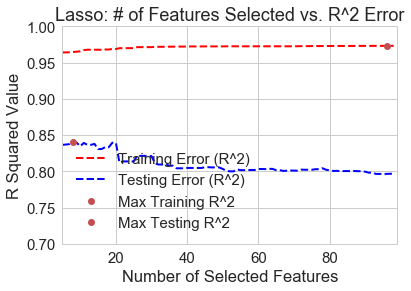

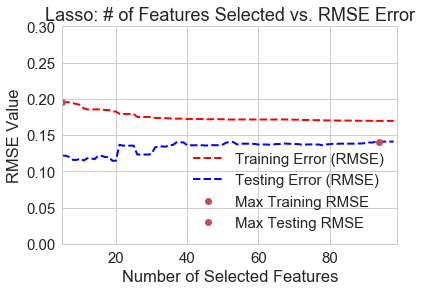

In [28]:
error_plot = pd.DataFrame()
error_plot['Number of Selected Features'] = np.arange(5, len(X_train.columns)+1, 1)
error_plot['Training Error (R^2)'] = train_err_r2
error_plot['Testing Error (R^2)'] = test_err_r2
error_plot['Training Error (RMSE)'] = train_err_rmse
error_plot['Testing Error (RMSE)'] = test_err_rmse

plt.plot('Number of Selected Features', "Training Error (R^2)", data=error_plot, marker='', color='red', linewidth=2, linestyle='dashed', label="Training Error (R^2)")
plt.plot('Number of Selected Features', "Testing Error (R^2)", data=error_plot, marker='', color='blue', linewidth=2, linestyle='dashed', label="Testing Error (R^2)")
max_train = plt.plot(max(np.arange(5, len(X_train.columns)+1, 1), key=lambda x: train_err_r2[x-5]), max(train_err_r2), 'ro', label="Max Training R^2")
max_test = plt.plot(max(np.arange(5, len(X_test.columns)+1, 1), key=lambda x: test_err_r2[x-5]), max(test_err_r2), 'ro', label="Max Testing R^2 ")
plt.ylim(.7,1)
plt.xlim(5,len(X_train.columns)+1)
plt.title("Lasso: # of Features Selected vs. R^2 Error")
plt.xlabel("Number of Selected Features")
plt.ylabel("R Squared Value")
plt.legend()
plt.show()

plt.plot('Number of Selected Features', "Training Error (RMSE)", data=error_plot, marker='', color='red', linewidth=2, linestyle='dashed', label="Training Error (RMSE)")
plt.plot('Number of Selected Features', "Testing Error (RMSE)", data=error_plot, marker='', color='blue', linewidth=2, linestyle='dashed', label="Testing Error (RMSE)")
max_train = plt.plot(max(np.arange(5, len(X_train.columns)+1, 1), key=lambda x: train_err_rmse[x-5]), max(train_err_rmse), 'ro', label="Max Training RMSE")
max_test = plt.plot(max(np.arange(5, len(X_test.columns)+1, 1), key=lambda x: test_err_rmse[x-5]), max(test_err_rmse), 'ro', label="Max Testing RMSE")
plt.ylim(0,.3)
plt.xlim(5,len(X_train.columns)+1)
plt.title("Lasso: # of Features Selected vs. RMSE Error")
plt.xlabel("Number of Selected Features")
plt.ylabel("RMSE Value")
plt.legend()
plt.show()

In [29]:
#Plot impact of k value on training/testing accuracy
train_err_r2 = []
test_err_r2 = []
train_err_rmse = []
test_err_rmse = []

for i in np.arange(5, len(X_train.columns)+1, 1):
    pipeline = Pipeline(
    [
     ('selector',SelectKBest(f_regression)),
     ('model', lm.Ridge(alpha=.001, max_iter=100000))
    ])

    search = GridSearchCV(
        estimator = pipeline,
        param_grid = {'selector__k':[i]},
        n_jobs=-1,
        scoring="neg_mean_squared_error",
        cv=10,
        verbose=10
    )

    grid_result = search.fit(X_train,Y_train)

    train_err_r2.append(r2_score(grid_result.predict(X_train), Y_train))
    test_err_r2.append(r2_score(grid_result.predict(X_test), Y_test))

    train_err_rmse.append(rmse(grid_result.predict(X_train), Y_train))
    test_err_rmse.append(rmse(grid_result.predict(X_test), Y_test))

Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.9s remaining:    9.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.6s remaining:    8.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.3s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.8s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.5s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    6.9s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.1s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.6s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.1s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.5s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    4.2s remaining:   10.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.3s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.3s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.3s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.2s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.0s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.0s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.1s remaining:    7.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.4s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.4s remaining:    8.1s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.6s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.3s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.7s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.2s remaining:    7.6s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.4s finished


Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    3.5s remaining:    8.2s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


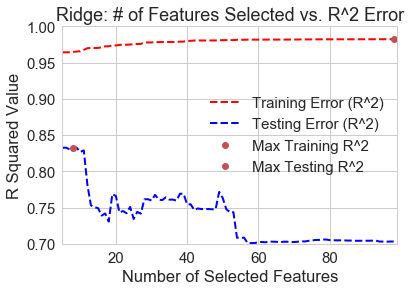

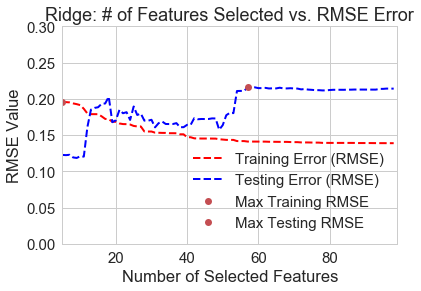

In [30]:
error_plot = pd.DataFrame()
error_plot['Number of Selected Features'] = np.arange(5, len(X_train.columns)+1, 1)
error_plot['Training Error (R^2)'] = train_err_r2
error_plot['Testing Error (R^2)'] = test_err_r2
error_plot['Training Error (RMSE)'] = train_err_rmse
error_plot['Testing Error (RMSE)'] = test_err_rmse

plt.plot('Number of Selected Features', "Training Error (R^2)", data=error_plot, marker='', color='red', linewidth=2, linestyle='dashed', label="Training Error (R^2)")
plt.plot('Number of Selected Features', "Testing Error (R^2)", data=error_plot, marker='', color='blue', linewidth=2, linestyle='dashed', label="Testing Error (R^2)")
max_train = plt.plot(max(np.arange(5, len(X_train.columns)+1, 1), key=lambda x: train_err_r2[x-5]), max(train_err_r2), 'ro', label="Max Training R^2")
max_test = plt.plot(max(np.arange(5, len(X_test.columns)+1, 1), key=lambda x: test_err_r2[x-5]), max(test_err_r2), 'ro', label="Max Testing R^2 ")
plt.ylim(.7,1)
plt.xlim(5,len(X_train.columns)+1)
plt.title("Ridge: # of Features Selected vs. R^2 Error")
plt.xlabel("Number of Selected Features")
plt.ylabel("R Squared Value")
plt.legend()
plt.show()

plt.plot('Number of Selected Features', "Training Error (RMSE)", data=error_plot, marker='', color='red', linewidth=2, linestyle='dashed', label="Training Error (RMSE)")
plt.plot('Number of Selected Features', "Testing Error (RMSE)", data=error_plot, marker='', color='blue', linewidth=2, linestyle='dashed', label="Testing Error (RMSE)")
max_train = plt.plot(max(np.arange(5, len(X_train.columns)+1, 1), key=lambda x: train_err_rmse[x-5]), max(train_err_rmse), 'ro', label="Max Training RMSE")
max_test = plt.plot(max(np.arange(5, len(X_test.columns)+1, 1), key=lambda x: test_err_rmse[x-5]), max(test_err_rmse), 'ro', label="Max Testing RMSE")
plt.ylim(0,.3)
plt.xlim(5,len(X_train.columns)+1)
plt.title("Ridge: # of Features Selected vs. RMSE Error")
plt.xlabel("Number of Selected Features")
plt.ylabel("RMSE Value")
plt.legend()
plt.show()

**PCA Regression:**
Performed PCA and fit a linear regression model to the principal components. For this model, the R^2 was really low, so we did not pursue this any further given our Lasso Regression model.

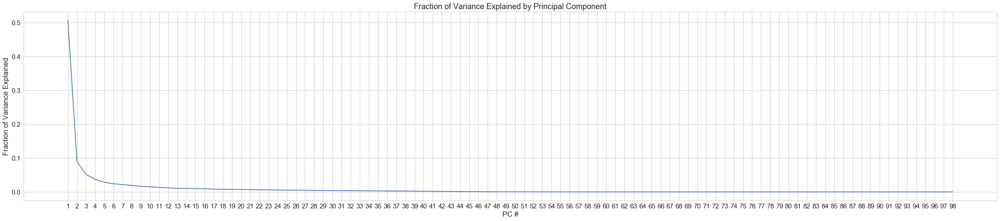

In [31]:
u, s, vt = np.linalg.svd(X_train, full_matrices=False)
plt.figure(figsize=(40, 8))
plt.plot(np.arange(1, len(s)+1), (s**2 / sum(s**2)));
plt.xticks(np.arange(1, len(s)+1), np.arange(1, len(s)+1));
plt.xlabel('PC #');
plt.title("Fraction of Variance Explained by Principal Component")
plt.ylabel('Fraction of Variance Explained');

In [32]:
pcs = X_train @ vt.T
selected = pcs.iloc[:, :1]
pca_model = lm.LinearRegression()
yfitted_select = pca_model.fit(selected, Y_train).predict(selected)

print("Selected Confirmed score: ", r2_score(Y_train, yfitted_select))
print("RMSE: ", rmse(Y_train, yfitted_select))

selected_test = X_test @ vt.T

yfitted_pca = pca_model.predict(X_test.iloc[:, :1])
print("Test Confirmed score: ", r2_score(Y_test,yfitted_pca))
print("RMSE: ", rmse(Y_test, yfitted_pca))

Selected Confirmed score:  0.04605900895526205
RMSE:  1.0266737424429107
Test Confirmed score:  0.006136596095255964
RMSE:  0.23157581056993032


## Predicting Confirmed COVID-19 Cases Without Deaths ##

We did not pursue this problem as rigorously as we did with predicting the number of deaths because we recognized the inconsistency of confirmed cases (given lack of testing during the earlier stages of the pandemic during which the data was collected). 

**Linear Regression Model:**

In [33]:
#Model Selection via Linear Regression with GridSearch Cross Validation to serve as a form of Feature Selection:
from sklearn.model_selection import train_test_split
from sklearn import linear_model as lm
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest,f_regression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score


def rmse(predicted, actual):
    """
    Calculates RMSE from actual and predicted values
    Input:
      predicted (1D array): vector of predicted/fitted values
      actual (1D array): vector of actual values
    Output:
      a float, the root-mean square error
    """
    return np.sqrt(np.mean((actual - predicted)**2))

logistics_features = ['countyFIPS','PopulationEstimate2018',
       'PopTotalMale2017', 'PopTotalFemale2017', 'FracMale2017',
       'PopulationEstimate65+2017', 'PopulationDensityperSqMile2010',
       'CensusPopulation2010', 'MedianAge2010', '#EligibleforMedicare2018',
       'MedicareEnrollment,AgedTot2017', 'DiabetesPercentage',
       'HeartDiseaseMortality', 'StrokeMortality', 'Smokers_Percentage',
       'RespMortalityRate2014', '#FTEHospitalTotal2017',
       'TotalM.D.s,TotNon-FedandFed2017', '#HospParticipatinginNetwork2017',
       '#Hospitals', '#ICU_beds', 'dem_to_rep_ratio', 'PopMale<52010',
       'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopMale10-142010',
       'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010',
       'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010',
       'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010',
       'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010',
       'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010',
       'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010',
       'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010',
       'PopMale>842010', 'PopFmle>842010', '3-YrMortalityAge45-54Years2015-17',
       '3-YrMortalityAge55-64Years2015-17',
       '3-YrMortalityAge65-74Years2015-17',
       '3-YrMortalityAge75-84Years2015-17', '3-YrMortalityAge85+Years2015-17',
       'stay at home', '>50 gatherings', '>500 gatherings', 'public schools',
       'restaurant dine-in', 'entertainment/gym', 'SVIPercentile', 'CensusId',
       'TotalPop', 'Men', 'Women', 'Hispanic', 'White', 'Black', 'Native',
       'Asian', 'Pacific', 'Citizen', 'Income', 'IncomeErr', 'IncomePerCap',
       'IncomePerCapErr', 'Poverty', 'ChildPoverty', 'Professional', 'Service',
       'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute',
       'Employed', 'PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork',
       'Unemployment', 'Confirmed']

finalmatrix = logistics_with_deaths[logistics_features].copy()

for i in finalmatrix.columns:
    finalmatrix[i] = (finalmatrix[i] - finalmatrix[i].mean())/finalmatrix[i].std()

normalizedlog = finalmatrix.copy()

train, test = train_test_split(normalizedlog, test_size=0.1, random_state=180)

X_train = train.drop(columns=["Confirmed"])
Y_train = np.array(train["Confirmed"])

X_test = test.drop(columns=["Confirmed"])
Y_test = np.array(test["Confirmed"])

linear_model = lm.LinearRegression(fit_intercept=True, normalize=True)
linear_model.fit(X_train, Y_train)

train_err = r2_score(linear_model.predict(X_train), Y_train)
print("Train R^2: ", train_err)
test_err = r2_score(linear_model.predict(X_test), Y_test)
print("Test R^2: ", test_err)

print("Train RMSE: ", rmse(linear_model.predict(X_train), Y_train))
print("Test RMSE: ", rmse(linear_model.predict(X_test), Y_test))

#RMSE CV Mean is not really consistent, so let's see why!
print("RMSE CV Mean: ", np.sqrt(-1*cross_val_score(linear_model, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')).mean())

Train R^2:  0.8332689680749839
Test R^2:  -1.3368715639920423
Train RMSE:  0.39392653640807135
Test RMSE:  0.7820790809203233
RMSE CV Mean:  0.8326050477308142


**Plotted Predicted versus Actual Confirmed COVID-19 Cases**

As shown by the plot, we are predicting a wider range.

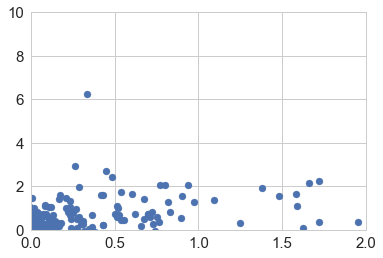

In [34]:
#Compare
compare = pd.DataFrame()
compare["Predicted"] = linear_model.predict(X_train)
compare["Actual"] = Y_train

plt.scatter(x=compare['Actual'], y=compare['Predicted'])
plt.xlim(0, 2)
plt.ylim(0, 10)
plt.show(block=True);

**Attempted a GridSearchCV with a Linear Regression Model + F Regression for Feature Selection:**

The RMSE/R^2 were still bad.

In [35]:
pipeline = Pipeline(
    [
     ('selector',SelectKBest(f_regression)),
     ('model', lm.LinearRegression())
    ])

#ridge = lm.Ridge(alpha=1)
#alpha_vals = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
max_iterations = [1000, 10000, 100000, 1000000]
selector_k = np.arange(50, len(X_train.columns) + 1)



search = GridSearchCV(
    estimator = pipeline,
    #param_grid = {'selector__k':np.arange(1,len(X_train.columns) + 1)},
    param_grid = {'selector__k':selector_k},
    n_jobs=-1,
    scoring="neg_mean_squared_error",
    cv=10,
    verbose=10
)

grid_result = search.fit(X_train,Y_train)

train_err = r2_score(grid_result.predict(X_train), Y_train)
print("Train R^2: ", train_err)
test_err = r2_score(grid_result.predict(X_test), Y_test)
print("Test R^2: ", test_err)

print("Train RMSE: ", rmse(grid_result.predict(X_train), Y_train))
print("Test RMSE: ", rmse(grid_result.predict(X_test), Y_test))

#lasso = lm.Lasso()

from sklearn.model_selection import cross_val_score

#print("RMSE CV Mean: ", np.sqrt(-1*cross_val_score(grid_result, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')).mean())
#print("RMSE CV: ", np.sqrt(-1*cross_val_score(grid_result, X_train, Y_train, cv=10, scoring='neg_mean_squared_error')))

print("Best Params: ", grid_result.best_params_)
print("Best Score: ", np.sqrt(-1*grid_result.best_score_))

Fitting 10 folds for each of 48 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1980s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 107 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 167 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 201 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 311 tasks      | elap

Train R^2:  0.8133991414279366
Test R^2:  -1.4788448931618565
Train RMSE:  0.4132347950982866
Test RMSE:  0.7498065809768696
Best Params:  {'selector__k': 52}
Best Score:  1.0733793542376115


**Printing out the 52 selected features for model based on F Regression:**

In [36]:
#features=list(X_train.columns[grid_result.best_estimator_.support_])
#features
classifier = grid_result.best_estimator_.named_steps['selector']

mask = classifier.get_support() #list of booleans
new_features = [] # The list of your K best features

for bool, feature in zip(mask, X_train.columns.values):
    if bool:
        new_features.append(feature)
print("Selected Features: ", new_features)

Selected Features:  ['PopulationEstimate2018', 'PopTotalMale2017', 'PopTotalFemale2017', 'PopulationEstimate65+2017', 'PopulationDensityperSqMile2010', 'CensusPopulation2010', '#EligibleforMedicare2018', 'MedicareEnrollment,AgedTot2017', '#FTEHospitalTotal2017', 'TotalM.D.s,TotNon-FedandFed2017', '#HospParticipatinginNetwork2017', '#Hospitals', '#ICU_beds', 'dem_to_rep_ratio', 'PopMale<52010', 'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010', 'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010', 'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010', 'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010', 'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010', 'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010', 'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010', 'PopMale>842010', 'PopFmle>842010', '3-YrMortalityAge45-54Years2015-17', '3-YrMortalityAge55-64Years2015-17', '3-YrMortalityAge65-

And that's it! Thank you for making it all the way through this notebook. Thanks for the great semester!